# Machine Learning NanoDegree
                                                                                        
  ## Captsone Project 

In [1]:
!git clone https://github.com/Gelboo/finalProject-LicencePlate-.git

Cloning into 'finalProject-LicencePlate-'...
remote: Enumerating objects: 2054, done.
remote: Total 2054 (delta 0), reused 0 (delta 0), pack-reused 2054
Receiving objects: 100% (2054/2054), 301.66 MiB | 43.43 MiB/s, done.
Resolving deltas: 100% (65/65), done.
Checking out files: 100% (1952/1952), done.


In [2]:
!ls

finalProject-LicencePlate-  sample_data


In [3]:
cd finalProject-LicencePlate-/

/content/finalProject-LicencePlate-


**Project Description:**

    License Plate Recognition for rader system or for quick look up for information about the car I Create an algorithm for detecting the license plate and then extract the license numbes from the plate.
    
    the input images and testing image you can find it on this link : https://github.com/Gelboo/finalProject-LicencePlate-/tree/master/Pictures
    
    
![Sample car input](https://github.com/Gelboo/finalProject-LicencePlate-/blob/master/image3.jpg?raw=1)

For this project I 'll train 3 differnt model :
        
        1- model for classify if image contain License or not
        2- model for classify the input image (character) to the correspond class (which Character) -> 36 class
     
 **steps for each model**
 <ul>
    <li> create/Gather dataset</li>
    <li> load data set </li>
    <li> Preprocessing </li>
    <li> build the model </li>
    <li> train the models </li>
    <li> extract ROI </li>
    <li> predict License Number </li>
 </ul>
   

**Step1 : dataset**

for License Plate write function to download images provided in the link as input and save it in path '/Pictures/Train_Images/' when runing the code will ask for directory name for saving the images in

In [0]:
from bs4 import BeautifulSoup
import requests
import re
import urllib.request
import os
#import cookielib
import json

def get_soup(url,header):
    return BeautifulSoup(urllib2.urlopen(urllib2.Request(url,headers=header)),'html.parser')

def gather_images(url):
    query = raw_input("Enter Directroy Name: ")
    image_type=query
    query= query.split()

    query='+'.join(query)
    print ('url')
    #add the directory for your image here
    DIR="Pictures"
    header={'User-Agent':"Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/43.0.2357.134 Safari/537.36"
    }
    soup = get_soup(url,header)


    ActualImages=[]# contains the link for Large original images, type of  image
    for a in soup.find_all("div",{"class":"rg_meta"}):
        link , Type =json.loads(a.text)["ou"]  ,json.loads(a.text)["ity"]
        ActualImages.append((link,Type))

    print  ("there are total" , len(ActualImages),"images")

    if not os.path.exists(DIR):
                os.mkdir(DIR)
    DIR = os.path.join(DIR, query.split()[0])

    if not os.path.exists(DIR):
                os.mkdir(DIR)
    ###print images
    for i , (img , Type) in enumerate( ActualImages):
        try:
            req = urllib2.Request(img, headers={'User-Agent' : header})
            raw_img = urllib2.urlopen(req).read()

            cntr = len([i for i in os.listdir(DIR) if image_type in i]) + 1
#             print cntr
            if len(Type)==0:
                f = open(os.path.join(DIR , image_type + "_" + str(cntr)+".jpg"), 'wb')
            else :
                f = open(os.path.join(DIR , image_type + "_" +  str(cntr)+"."+Type), 'wb')


            f.write(raw_img)
            f.close()
        except Exception as e:
            print ("could not load : "+img)
            print (e)

# gather_images("https://www.google.com.eg/search?biw=1920&bih=965&tbm=isch&sa=1&ei=Xai9WoWVIYK00gX4s5SoBg&q=car+tires&oq=car+tires&gs_l=psy-ab.3..0l10.361929.364369.0.364541.7.6.0.1.1.0.169.757.0j5.5.0....0...1c.1.64.psy-ab..1.6.764...0i67k1.0.2pF0x1ItCDU")

call gather_images() function with differnt input links for images likes (license,other images than license) 

for second and third model I build image of character using differnt type of font :
    type of fonts I used:
    
         1-DejavuSerif      2-liberation Serif     3-Nimbus SansL     4-free Sans
         5-Free Serif       6-Libreation Sans Narrow   7-Nimbus SansL    8-Nimbus MonoL

save images in path 'Pictures/Train_Images/TrainChar' ,where every Character/number has it own folder inside locate all image for this Character/number
                    

# First Model
**Let Me begin With first model to predict if the image contain or not contain License plate**

First Load DataSet for license Plate

In [5]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from PIL import Image
import glob
%matplotlib inline 

licenselist = glob.glob('Pictures/Train_Images/plate_images/*')

licensee = np.array([np.array(cv2.resize(cv2.imread(licensename),(100,100))) for licensename in licenselist])

print ("Number of image: {} \nSize of the image: {}".format(licensee.shape[0],licensee.shape[1:]))

Number of image: 447 
Size of the image: (100, 100, 3)


Add Label for this images y = 1 (where the License Plate exisit)

In [6]:
x_y = np.array([[img,1] for img in licensee])
print (x_y.shape)

(447, 2)


View first 36 example image in Licensee

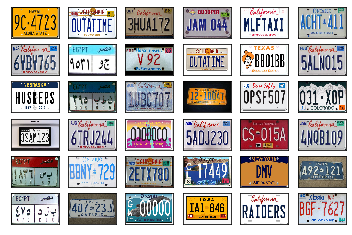

In [7]:
for i in range(36):
    plt.subplot(6,6,i+1,xticks=[],yticks=[])
    plt.imshow(licensee[i][:,:,[2,1,0]] , interpolation='nearest' , aspect='auto')
plt.show()

Load the other images locate in path 'Pictures/Train_Images/other_images' which contain images other than licnese plate

In [8]:
otherList = glob.glob('Pictures/Train_Images/other_images/*')
others = np.array([np.array(cv2.resize(cv2.imread(other),(100,100))) for other in otherList])
print ("Number of image: {} \nSize of the image: {}".format(others.shape[0],others.shape[1:]))

Number of image: 460 
Size of the image: (100, 100, 3)


Add label for this images y = 0 (for not contain License) and Concatenate to the last data x_y

In [9]:
x_y = np.vstack((x_y,np.array([[img,0] for img in others])))
print (x_y.shape)

(907, 2)


View first 36 item in others image List

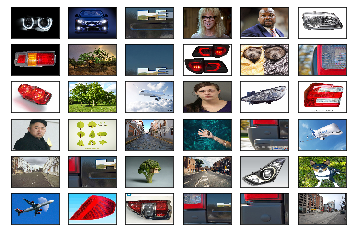

In [10]:
for i in range(36):
    plt.subplot(6,6,i+1,xticks=[],yticks=[])
    plt.imshow(others[i][:,:,[2,1,0]],interpolation='nearest',aspect='auto')
plt.show()

randomize the data to remove any pattern in the data ( not make the images with label 1 after each other)
and show the first 36 example after randomized

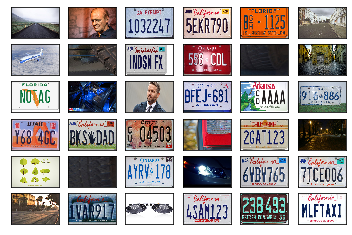

In [11]:
np.random.shuffle(x_y)
# show randomize picture
for i in range(36):
    plt.subplot(6,6,i+1,xticks=[],yticks=[])
    plt.imshow(x_y[i][0][:,:,[2,1,0]],interpolation='nearest',aspect='auto')
plt.show()

Split the data into Training,and Testing

In [12]:
# take last 80% as train set
uptill = int(len(x_y)*0.8)

x_y_train = x_y[:uptill,:]
x_y_test = x_y[uptill:,:]

print ("Size of trianing:",x_y_train.shape[0])
print ("Size of testing:",x_y_test.shape[0])

Size of trianing: 725
Size of testing: 182


In [0]:
def divide_img_lbl(data):
    """ split data into image and label"""
    x = []
    y = []
    for [item,lbl] in data:
        x.append(item)
        y.append(lbl)
    x = np.array(x)
    y = np.array(y)
    return x,y

Spilitin the data into input features(image) and output(Label) for testing and training

In [14]:
x_train,y_train = divide_img_lbl(x_y_train)
x_test,y_test = divide_img_lbl(x_y_test)

print ("Train Input Shape:",x_train.shape)
print ("Train Size:",y_train.shape[0])
print ("Test Input Shape:",x_test.shape)
print ("Test Size:",y_test.shape[0])

Train Input Shape: (725, 100, 100, 3)
Train Size: 725
Test Input Shape: (182, 100, 100, 3)
Test Size: 182


Rescale the image channels from [0,255] to [0,1]

In [0]:
x_train = x_train.astype('float32')/255
x_test = x_test.astype('float32')/255

Split the training set into Training and Validation

In [16]:
uptill = int(len(x_train)*0.8)
(x_train,x_valid) = x_train[:uptill],x_train[uptill:]
(y_train,y_valid) = y_train[:uptill],y_train[uptill:]
print ("Size of training set:",y_train.shape[0])
print ("Size of validation set:",y_valid.shape[0])

Size of training set: 580
Size of validation set: 145


**Create the Model**

In [17]:
import keras
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D,Flatten,Dense,Dropout

model = Sequential()
model.add(Conv2D(filters = 16,kernel_size=2,padding='same',activation='relu',input_shape=(100,100,3)))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=32,kernel_size=2,padding='same',activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=64,kernel_size=2,padding='same',activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.3))
model.add(Flatten())
model.add(Dense(500,activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(1,activation='sigmoid'))

model.summary()
# compile the model
model.compile(loss='mean_squared_error',optimizer='rmsprop',metrics=['accuracy'])

Using TensorFlow backend.







Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 100, 100, 16)      208       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 50, 50, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 50, 50, 32)        2080      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 25, 25, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 25, 25, 64)        8256      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 12, 12, 64)        0         


Train the Model

In [18]:
from keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath='model.weights.best.hdf5',verbose=1,save_best_only=True)

# hist = model.fit(x_train,y_train,batch_size=32,epochs=100,validation_data=(x_valid,y_valid),callbacks=[checkpointer],verbose=2,shuffle=True)

# load weight with best validation score
model.load_weights('model.weights.best.hdf5')

calculate the Model Accuracy

In [19]:
score = model.evaluate(x_test,y_test,verbose=0)
print ('test accuracy',score[1])

test accuracy 0.9835164815514952


The Model accuracy = 98%

View first 40 examples Labeled as 'Y' for License and 'N' for No License

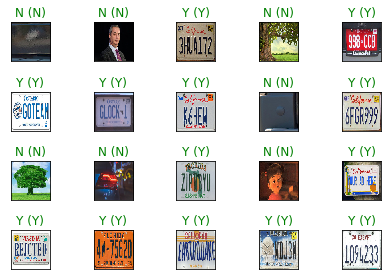

In [20]:
Labels = ['N','Y']
y_hat = model.predict(x_test)
y_hat = np.round(y_hat).astype('int').flatten()
for i in range(20):
    plt.subplot(4,5,i+1,xticks=[],yticks=[])
    plt.imshow(np.squeeze(x_test[i][:,:,[2,1,0]]))
    plt.title("{} ({})".format(Labels[y_hat[i]],Labels[y_test[i]] ),color=("green" if y_hat[i] == y_test[i] else "red"))
plt.tight_layout()
plt.show()

Before Search on the License plate in the image we can Check if the image contain license plate

the second part is Sliding window to 

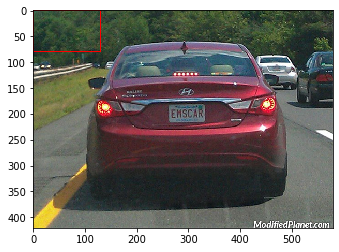

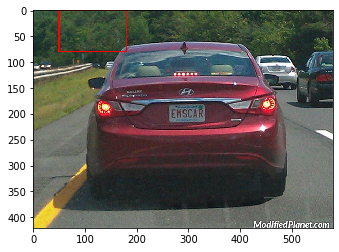

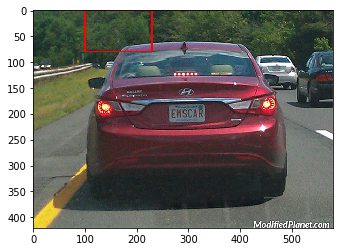

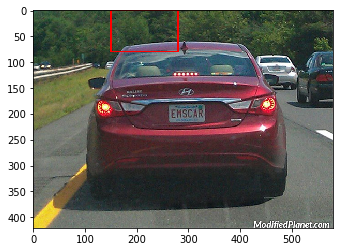

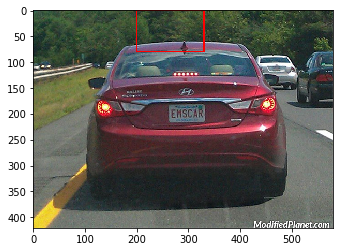

...

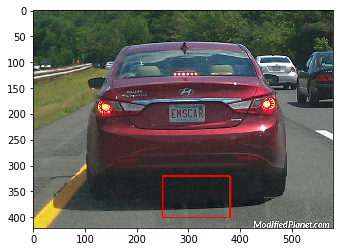

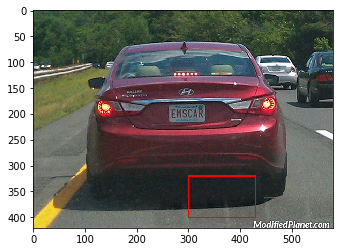

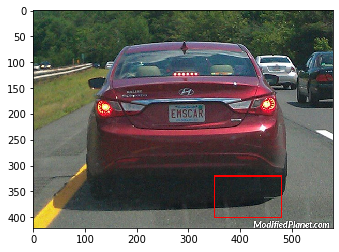

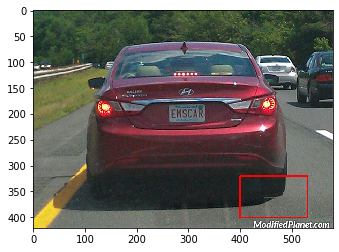

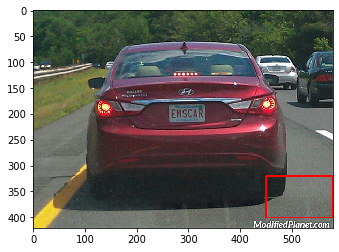

In [21]:
from pyramid import *
import time

im = cv2.imread('image3.jpg')

(winW,winH) = (130,80)
stepSizeH,stepSizeV = 50,winH
possible_license = []
for resized in pyramid(im,scale = 3,minSize=(200,200)):
    for (x,y,window) in sliding_window(resized,stepSizeH=stepSizeH,stepSizeV=stepSizeV,windowSize=(winW,winH)):
        #if window doesn't meet window size ignore it
        if window.shape[0] != winH or window.shape[1] != winW:
            continue
        img = np.array([cv2.resize(window,(100,100))])
        prediction = model.predict(img)
        color = (0,0,255)
        if prediction == 1:
            possible_license.append(window)
            color = (255,0,0)
        clone = resized.copy()
        cv2.rectangle(clone,(x,y),(x+winW,y+winH),color,2)
#         cv2.imshow("img",clone)
        plt.imshow(clone[:,:,[2,1,0]])
        plt.show()
#         cv2.waitKey(1)
#         time.sleep(0.5)


View All Possible Image as License

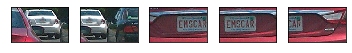

In [22]:
for i,im in enumerate(possible_license):
    plt.subplot(1,len(possible_license),i+1,xticks=[],yticks=[])
    plt.imshow(im[:,:,[2,1,0]])

# Second Model
**Description**
    this model for Label character/numbers in image each input_image contain one Character/number feed it to the model to classify which class belong to

Prepare the data For the model (Load every Image in the path and assign it into the Label whcih is the directory name) then randomize the data for remove any pattern in the data

In [23]:
Upper_Characters = ['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R',
'S','T','U','V','W','X','Y','Z']
numbers = ['0','1','2','3','4','5','6','7','8','9']
def prepare_X_Y(path):
    lbl = 0
    charList = glob.glob(path+'A/*')
    chars = np.array([np.array(cv2.resize(cv2.imread(char),(100,100))) for char in charList])
    x_y = np.array([[img,lbl] for img in chars])
    lbl += 1
    digits = Upper_Characters[1:] + numbers
    for d in digits:
        # print d
        charList = glob.glob(path + d + '/*')
        chars = np.array([np.array(cv2.resize(cv2.imread(char),(100,100))) for char in charList])
        x_y = np.vstack((x_y,np.array([[img,lbl] for img in chars])))
        lbl += 1
    # print x_y.shape
    # print x_y[:,1]
    np.random.shuffle(x_y)
    return x_y
x_y_train = prepare_X_Y('Pictures/Train_Images/TrainChar/')
x_y_test = prepare_X_Y('Pictures/Test_images/Test_char/')
print ("number of training Examples:", x_y_train.shape[0])
print ("number of testing Examples:",x_y_test.shape[0])

number of training Examples: 499
number of testing Examples: 36


View First 36 item in the dataSet

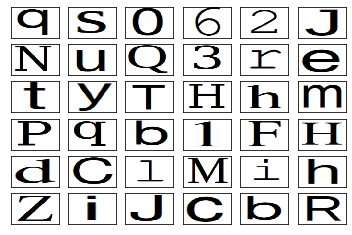

In [24]:
for i in range(36):
    plt.subplot(6,6,i+1,xticks=[],yticks=[])
    plt.imshow(x_y_train[i,0][:,:,[2,1,0]],interpolation='nearest',aspect='auto')
plt.show()

Split training and testing into input features(images) and output (Label)

In [25]:
x_train,y_train = divide_img_lbl(x_y_train)
x_test,y_test = divide_img_lbl(x_y_test)

print ("input Shape",x_train.shape[1:])
print ("Training Examples:",x_train.shape[0])
print ("testing Examples:",x_test.shape[0])

input Shape (100, 100, 3)
Training Examples: 499
testing Examples: 36


Rescale the image form [0,255] to [0,1]


In [0]:
x_train = x_train.astype('float32')/255
x_test = x_test.astype('float32')/255

One Hot-Encoding For every unique Class (=36) for labels in y_train and y_test

In [0]:
num_classes = 36
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

Divide Training set into training set and validation set

In [28]:
uptill = int(len(x_train)*0.8)
(x_train,x_valid) = x_train[:uptill],x_train[uptill:]
(y_train,y_valid) = y_train[:uptill],y_train[uptill:]
print ("The Size of Trianing set:",x_train.shape[0])
print ("The Size of Validation set:",x_valid.shape[0])

The Size of Trianing set: 399
The Size of Validation set: 100


Build the model for Classify each model to it's own image

In [29]:
model2 = Sequential()
model2.add(Conv2D(filters = 16,kernel_size=2,padding='same',activation='relu',input_shape=(100,100,3)))
model2.add(MaxPooling2D(pool_size=2))
model2.add(Conv2D(filters=32,kernel_size=2,padding='same',activation='relu'))
model2.add(MaxPooling2D(pool_size=2))
model2.add(Conv2D(filters=64,kernel_size=2,padding='same',activation='relu'))
model2.add(MaxPooling2D(pool_size=2))
model2.add(Conv2D(filters=128,kernel_size=2,padding='same',activation='relu'))
model2.add(MaxPooling2D(pool_size=2))

model2.add(Dropout(0.2))
model2.add(Flatten())
model2.add(Dense(1000,activation='relu'))
model2.add(Dropout(0.2))
model2.add(Dense(1200,activation='relu'))
model2.add(Dropout(0.2))
model2.add(Dense(1000,activation='relu'))
model2.add(Dropout(0.2))


model2.add(Dense(36,activation='softmax'))
model2.summary()

#compile the model
model2.compile(loss='mean_squared_error', optimizer='rmsprop',metrics=['accuracy'])

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 100, 100, 16)      208       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 50, 50, 16)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 50, 50, 32)        2080      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 25, 25, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 25, 25, 64)        8256      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 12, 12, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 12, 12, 128)      

Train the model  and save the best weight in 'modelChar.weights.best.hdf5'

In [30]:
checkpointer = ModelCheckpoint(filepath='modelChar.weights.best.hdf5', verbose=1,
                               save_best_only=True)
hist = model2.fit(x_train,y_train,batch_size=32,epochs=100,validation_data=(x_valid,y_valid),callbacks=[checkpointer],verbose=2,shuffle=True)
# load weight with best validation score
model2.load_weights('modelChar.weights.best.hdf5')




Train on 399 samples, validate on 100 samples
Epoch 1/100
 - 1s - loss: 0.0271 - acc: 0.0175 - val_loss: 0.0270 - val_acc: 0.0000e+00

Epoch 00001: val_loss improved from inf to 0.02701, saving model to modelChar.weights.best.hdf5
Epoch 2/100
 - 0s - loss: 0.0270 - acc: 0.0326 - val_loss: 0.0270 - val_acc: 0.0400

Epoch 00002: val_loss improved from 0.02701 to 0.02696, saving model to modelChar.weights.best.hdf5
Epoch 3/100
 - 0s - loss: 0.0268 - acc: 0.0702 - val_loss: 0.0267 - val_acc: 0.0700

Epoch 00003: val_loss improved from 0.02696 to 0.02668, saving model to modelChar.weights.best.hdf5
Epoch 4/100
 - 0s - loss: 0.0265 - acc: 0.0777 - val_loss: 0.0265 - val_acc: 0.1200

Epoch 00004: val_loss improved from 0.02668 to 0.02650, saving model to modelChar.weights.best.hdf5
Epoch 5/100
 - 0s - loss: 0.0265 - acc: 0.1303 - val_loss: 0.0261 - val_acc: 0.2200

Epoch 00005: val_loss improved from 0.02650 to 0.02610, saving model to modelChar.weights.best.hdf5
Epoch 6/100
 - 0s - loss: 0

check the accuracy of the model on the test set 

In [31]:
score = model2.evaluate(x_test,y_test,verbose=0)
print ('test accuracy',score[1])

test accuracy 0.8055555555555556


The accuracy of the algorithm = 70% 

View first 36 items in the dataSets Label them with Green If Prediction is Right and color is red if the prediction is Wrong ,and the true value locate inside ()

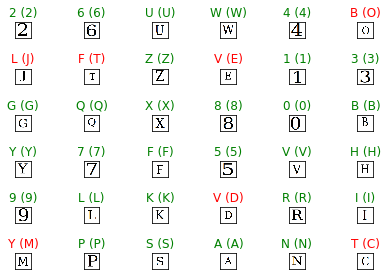

In [32]:
Labels = Upper_Characters + numbers
y_hat = (model2.predict(x_test))
for i in range(x_test.shape[0]):
    plt.subplot(6,6,i+1,xticks=[],yticks=[])
    plt.imshow(np.squeeze(x_test[i][:,:,[2,1,0]]))
    pred_idx = np.argmax(y_hat[i])
    true_idx = np.argmax(y_test[i])
    plt.title("{} ({})".format(Labels[pred_idx],Labels[true_idx] ),color=("green" if pred_idx == true_idx else "red"))
plt.tight_layout()
plt.show()

Final step After detecting the license plate we use opencv library findContours for detecting ROI (characters) then classify which character are these belong to try to find the License for these extract License Plate

![License Image](https://github.com/Gelboo/finalProject-LicencePlate-/blob/master/imgg.png?raw=1)

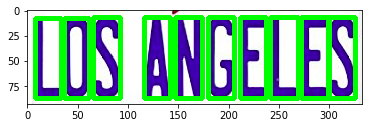

In [33]:
im = cv2.imread("imgg.png")
im3 = im.copy()

gray = cv2.cvtColor(im,cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray,(5,5),0)
thresh = cv2.adaptiveThreshold(blur,255,1,1,11,2)
(ctrs, _) = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
#_,ctrs,_ = cv2.findContours(thresh, 1, 2)
for cnt in ctrs:
    if cv2.contourArea(cnt)>500:
        [x,y,w,h] = cv2.boundingRect(cnt)
        if h > 70:
            cv2.rectangle(im, (x, y), (x + w,y + h), (0, 255, 0), 3)
            roi1 = im[y:y+h,x:x+w]
            roi = np.array([cv2.resize(roi1,(100,100))])
            predict = Labels[np.argmax(model2.predict(roi))]
plt.imshow(im[:,:,[2,1,0]])
plt.show()
